In [ ]:
#Bibliotecas utilizadas
import pandas as pd
from sklearn import preprocessing
import numpy as np
import copy
import matplotlib.pyplot as plt
#Naive Bayes
from sklearn.naive_bayes import GaussianNB
#Importando o regressor de Arvore de decisçao do sklearn
from sklearn.tree import DecisionTreeRegressor, plot_tree
#Random Forest para classificação
from sklearn.ensemble import RandomForestClassifier
# Bibliotecas para o KNN
from sklearn import neighbors
#Biblioteca para árvore de decisão para classificação
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
import pydot
import graphviz
import pydotplus
#Métricas de avaliação
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix
import seaborn as sns
#Balanceamento dos dados - Oversample
from imblearn.under_sampling import RandomUnderSampler, NearMiss
from collections import Counter
from sklearn.datasets import make_classification
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import train_test_split


# Leitura da Base de Dados

In [ ]:
#Lendo base de dados
df = pd.read_csv("diabetes_prediction_dataset.csv")
df

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,Female,80.0,0,1,never,25.19,6.6,140,0
1,Female,54.0,0,0,No Info,27.32,6.6,80,0
2,Male,28.0,0,0,never,27.32,5.7,158,0
3,Female,36.0,0,0,current,23.45,5.0,155,0
4,Male,76.0,1,1,current,20.14,4.8,155,0
...,...,...,...,...,...,...,...,...,...
99995,Female,80.0,0,0,No Info,27.32,6.2,90,0
99996,Female,2.0,0,0,No Info,17.37,6.5,100,0
99997,Male,66.0,0,0,former,27.83,5.7,155,0
99998,Female,24.0,0,0,never,35.42,4.0,100,0


# Pré-Processamento



In [ ]:
#Print para verificar se tem inconsistência nos dados
print("Valores em Falta:\n", df.isnull().sum())
print("--------------------------------------------------------------------------------------------------------------\n")
print("Valores Duplicados:\n", df.duplicated())
print("--------------------------------------------------------------------------------------------------------------\n")


Valores em Falta:
 gender                 0
age                    0
hypertension           0
heart_disease          0
smoking_history        0
bmi                    0
HbA1c_level            0
blood_glucose_level    0
diabetes               0
dtype: int64
--------------------------------------------------------------------------------------------------------------

Valores Duplicados:
 0        False
1        False
2        False
3        False
4        False
         ...  
99995     True
99996    False
99997    False
99998    False
99999    False
Length: 100000, dtype: bool
--------------------------------------------------------------------------------------------------------------



In [ ]:
#retirando os dados duplicados
df.drop_duplicates(keep = False, inplace = True)
print("Valores Duplicados:\n", df.duplicated())
print("--------------------------------------------------------------------------------------------------------------\n")


Valores Duplicados:
 0        False
2        False
3        False
4        False
5        False
         ...  
99994    False
99996    False
99997    False
99998    False
99999    False
Length: 93061, dtype: bool
--------------------------------------------------------------------------------------------------------------



In [ ]:
#Mudando dados nominais para numéricos
df = df.replace(to_replace = "Female", value = "1")
df = df.replace(to_replace = "Other", value = "0.5")
df = df.replace(to_replace = "Male", value = "0")

df['gender'] = df['gender'].astype(str).astype(float) #Definimos o atributo gender da tabela como float

df.drop(df.loc[df['smoking_history'] == 'No Info'].index, inplace = True)

df = df.replace(to_replace = "never", value = "0.0")
df = df.replace(to_replace = "former", value = "1.0")
df = df.replace(to_replace = "not current", value = "2.0")
df = df.replace(to_replace = "current", value = "3.0")
df = df.replace(to_replace = "ever", value = "4.0")

df['smoking_history'] = df['smoking_history'].astype(str).astype(float) #Definimos o atributo gender da tabela como float

df

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,1.0,80.0,0,1,0.0,25.19,6.6,140,0
2,0.0,28.0,0,0,0.0,27.32,5.7,158,0
3,1.0,36.0,0,0,3.0,23.45,5.0,155,0
4,0.0,76.0,1,1,3.0,20.14,4.8,155,0
5,1.0,20.0,0,0,0.0,27.32,6.6,85,0
...,...,...,...,...,...,...,...,...,...
99992,1.0,26.0,0,0,0.0,34.34,6.5,160,0
99993,1.0,40.0,0,0,0.0,40.69,3.5,155,0
99997,0.0,66.0,0,0,1.0,27.83,5.7,155,0
99998,1.0,24.0,0,0,0.0,35.42,4.0,100,0


In [ ]:
#Normalização Por Escala

diabetes = df['diabetes']
df_normalizado_escala = pd.DataFrame(columns = df.columns)

coluna = []
coluna_normalizada = []
coluna = df['gender']
v_max = coluna.max() #valor máximo
v_min = coluna.min() #valor mínimo
print('gender')
print(v_max)
print(v_min)
for i in df['gender']:
    coluna_normalizada.append((float(i) - v_min) / (v_max - v_min))


df_normalizado_escala['gender'] = coluna_normalizada

coluna = []
coluna_normalizada = []
coluna = df['age']
v_max = coluna.max() #valor máximo
v_min = coluna.min() #valor mínimo
print('age	')
print(v_max)
print(v_min)
for i in df['age']:
    coluna_normalizada.append((float(i) - v_min) / (v_max - v_min))


df_normalizado_escala['age'] = coluna_normalizada

coluna = []
coluna_normalizada = []
coluna = df['hypertension']
v_max = coluna.max() #valor máximo
v_min = coluna.min() #valor mínimo
print('hypertension')
print(v_max)
print(v_min)
for i in df['hypertension']:
    coluna_normalizada.append((float(i) - v_min) / (v_max - v_min))


df_normalizado_escala['hypertension'] = coluna_normalizada


coluna = []
coluna_normalizada = []
coluna = df['heart_disease']
v_max = coluna.max() #valor máximo
v_min = coluna.min() #valor mínimo
print('heart_disease')
print(v_max)
print(v_min)
for i in df['heart_disease']:
    coluna_normalizada.append((float(i) - v_min) / (v_max - v_min))



df_normalizado_escala['heart_disease'] = coluna_normalizada


coluna = []
coluna_normalizada = []
coluna = df['smoking_history']
v_max = coluna.max() #valor máximo
v_min = coluna.min() #valor mínimo
print('smoking_history')
print(v_max)
print(v_min)
for i in df['smoking_history']:
    coluna_normalizada.append((float(i) - v_min) / (v_max - v_min))



df_normalizado_escala['smoking_history'] = coluna_normalizada


coluna = []
coluna_normalizada = []
coluna = df['bmi']
v_max = coluna.max() #valor máximo
v_min = coluna.min() #valor mínimo
print('bmi')
print(v_max)
print(v_min)
for i in df['bmi']:
    coluna_normalizada.append((float(i) - v_min) / (v_max - v_min))



df_normalizado_escala['bmi'] = coluna_normalizada


coluna = []
coluna_normalizada = []
coluna = df['HbA1c_level']
v_max = coluna.max() #valor máximo
v_min = coluna.min() #valor mínimo
print('HbA1c_level')
print(v_max)
print(v_min)
for i in df['HbA1c_level']:
    coluna_normalizada.append((float(i) - v_min) / (v_max - v_min))



df_normalizado_escala['HbA1c_level'] = coluna_normalizada


coluna = []
coluna_normalizada = []
coluna = df['blood_glucose_level']
v_max = coluna.max() #valor máximo
v_min = coluna.min() #valor mínimo
print('blood_glucose_level')
print(v_max)
print(v_min)
for i in df['blood_glucose_level']:
    coluna_normalizada.append((float(i) - v_min) / (v_max - v_min))


df_normalizado_escala['blood_glucose_level'] = coluna_normalizada

df_normalizado_escala['diabetes'] = diabetes.reset_index()['diabetes']

df_normalizado_escala

gender
1.0
0.0
age	
80.0
0.16
hypertension
1
0
heart_disease
1
0
smoking_history
4.0
0.0
bmi
91.82
10.08
HbA1c_level
9.0
3.5
blood_glucose_level
300
80


,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,1.0,1.000000,0.0,1.0,0.00,0.184854,0.563636,0.272727,0
1,0.0,0.348697,0.0,0.0,0.00,0.210913,0.400000,0.354545,0
2,1.0,0.448898,0.0,0.0,0.75,0.163567,0.272727,0.340909,0
3,0.0,0.949900,1.0,1.0,0.75,0.123073,0.236364,0.340909,0
4,1.0,0.248497,0.0,0.0,0.00,0.210913,0.563636,0.022727,0
...,...,...,...,...,...,...,...,...,...
62436,1.0,0.323647,0.0,0.0,0.00,0.296795,0.545455,0.363636,0
62437,1.0,0.498998,0.0,0.0,0.00,0.374480,0.000000,0.340909,0
62438,0.0,0.824649,0.0,0.0,0.25,0.217152,0.400000,0.340909,0
62439,1.0,0.298597,0.0,0.0,0.00,0.310007,0.090909,0.090909,0


In [ ]:
#Tabela de correlação, nenhum atributo possui alta correlação com outro.
corr = df_normalizado_escala.corr()
corr.style.background_gradient(cmap='coolwarm')

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
gender,1.000000,-0.022751,-0.027201,-0.091925,-0.074652,-0.010362,-0.029929,-0.030224,-0.056033
age,-0.022751,1.000000,0.253883,0.240736,0.051792,0.163265,0.119753,0.118804,0.263784
hypertension,-0.027201,0.253883,1.000000,0.115933,-0.001845,0.129124,0.087017,0.087456,0.190928
heart_disease,-0.091925,0.240736,0.115933,1.000000,0.045914,0.036835,0.072876,0.079090,0.168489
smoking_history,-0.074652,0.051792,-0.001845,0.045914,1.000000,0.023614,0.006202,0.006999,0.013992
bmi,-0.010362,0.163265,0.129124,0.036835,0.023614,1.000000,0.085120,0.095318,0.203516
HbA1c_level,-0.029929,0.119753,0.087017,0.072876,0.006202,0.085120,1.000000,0.197468,0.442728
blood_glucose_level,-0.030224,0.118804,0.087456,0.079090,0.006999,0.095318,0.197468,1.000000,0.452867
diabetes,-0.056033,0.263784,0.190928,0.168489,0.013992,0.203516,0.442728,0.452867,1.000000


# Separação do Treinamento e Teste

In [ ]:
df_treino = df_normalizado_escala.sample(frac=0.7, random_state = 73)
df_teste = pd.concat([df_normalizado_escala, df_treino]).drop_duplicates(keep=False)

# Separar as features e o target do conjunto de treinamento
y_train = df_treino['diabetes']
X_train = df_treino.drop(columns=['diabetes'])

# Separar as features e o target do conjunto de teste
X_test = df_teste.drop(columns=['diabetes'])
y_test = df_teste['diabetes']

# Métodos Supervisionados

##### Usando Dados Desbalanceados

<li> Naive Bayes </li>
<li> Random Forest</li>
<li> Decision Tree Classifier</li>
<li> KNN Classifier</li>

Acurácia: 89.97%
F1 score: 90.45%


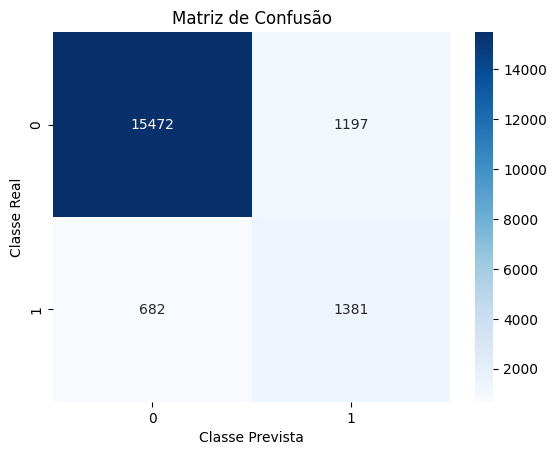

In [ ]:
#Naive Bayes

# Criar uma instância do classificador Naive Bayes
nb = GaussianNB()

# Treinar o modelo usando os dados de treinamento
nb.fit(X_train, y_train)

# Fazer previsões no conjunto de teste
y_pred = nb.predict(X_test)


# Calculando a acurácia e o F Score

print("Acurácia: %0.2f" % (accuracy_score(y_test, y_pred)*100) + "%")
print("F1 score: %0.2f" % (f1_score(y_test, y_pred, average='weighted')*100) + "%")

# Calcular a matriz de confusão
cmNaive = confusion_matrix(y_test, y_pred)

# Visualizar a matriz de confusão usando um heatmap
sns.heatmap(cmNaive, annot=True, fmt="d", cmap="Blues")

# Configurações adicionais
plt.title("Matriz de Confusão")
plt.xlabel("Classe Prevista")
plt.ylabel("Classe Real")

# Mostrar o gráfico
plt.show()

Acurácia: 95.99%
F1 score: 95.69%


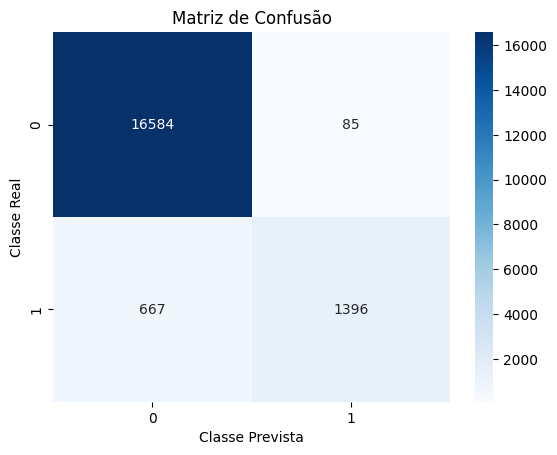

In [ ]:
#Rando Forest

# Criação e treinamento do modelo Random Forest
model = RandomForestClassifier(n_estimators=50, random_state = 73)
model.fit(X_train, y_train)

# Fazendo previsões com o modelo
y_pred = model.predict(X_test)

# Calculando a acurácia e o F Score

print("Acurácia: %0.2f" % (accuracy_score(y_test, y_pred)*100) + "%")
print("F1 score: %0.2f" % (f1_score(y_test, y_pred, average='weighted')*100) + "%")

# Calcular a matriz de confusão
cm = confusion_matrix(y_test, y_pred)

# Visualizar a matriz de confusão usando um heatmap
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Configurações adicionais
plt.title("Matriz de Confusão")
plt.xlabel("Classe Prevista")
plt.ylabel("Classe Real")

# Mostrar o gráfico
plt.show()

Acurácia: 93.34%
F1 score: 93.47%


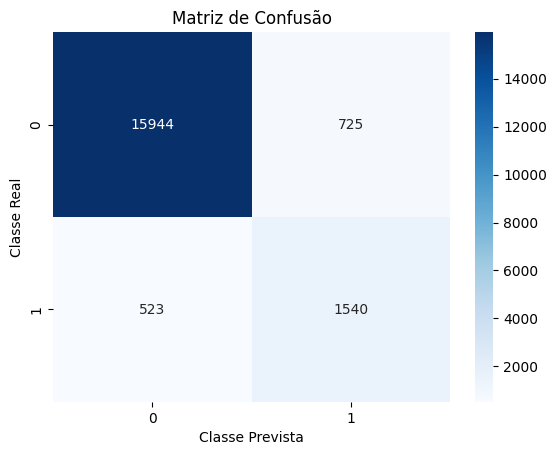

In [ ]:
#Árvore de decisão

features = df_normalizado_escala.drop(['diabetes'], axis=1) #características
features_names = list(features.columns)

#Sem profundidade definida
dt = DecisionTreeClassifier()

#Construção do modelo
model = dt.fit(X_train, y_train)

y_pred = model.predict(X_test)


#Métricas para avaliar o modelo

# Calculando a acurácia e o F Score
print("Acurácia: %0.2f" % (accuracy_score(y_test, y_pred)*100) + "%")
print("F1 score: %0.2f" % (f1_score(y_test, y_pred, average='weighted')*100) + "%")

# Calcular a matriz de confusão
cm = confusion_matrix(y_test, y_pred)

# Visualizar a matriz de confusão usando um heatmap
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Configurações adicionais
plt.title("Matriz de Confusão")
plt.xlabel("Classe Prevista")
plt.ylabel("Classe Real")

# Mostrar o gráfico
plt.show()

#Plot da árvore de decisão

dot_data = tree.export_graphviz(
         dt,
         out_file=None,
         feature_names=features_names,
         filled=True, rounded=True,
         proportion=False,
         node_ids=True,
         rotate=False
        )
graph = graphviz.Source(dot_data)
graph

Acurácia: 93.21%
F1 score: 93.14%


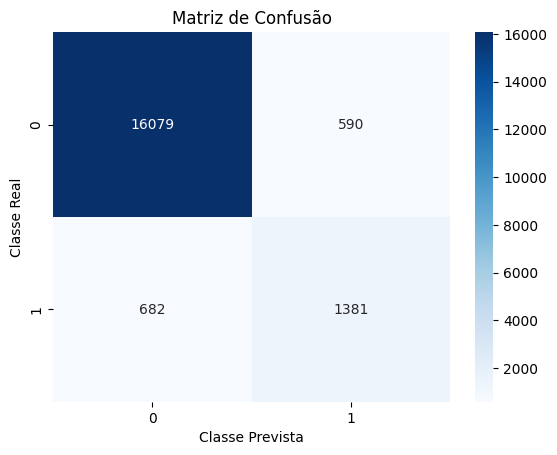

In [ ]:
#KNN

#Construção do modelo
knn = neighbors.KNeighborsClassifier(n_neighbors=1)  #número de vizinhos = 1

knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)

#Métricas para avaliar o modelo

# Calculando a acurácia e o F Score

print("Acurácia: %0.2f" % (accuracy_score(y_test, y_pred)*100) + "%")
print("F1 score: %0.2f" % (f1_score(y_test, y_pred, average='weighted')*100) + "%")

# Calcular a matriz de confusão
cm = confusion_matrix(y_test, y_pred)

# Visualizar a matriz de confusão usando um heatmap
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Configurações adicionais
plt.title("Matriz de Confusão")
plt.xlabel("Classe Prevista")
plt.ylabel("Classe Real")

# Mostrar o gráfico
plt.show()

Acurácia: 94.70%
F1 score: 94.38%


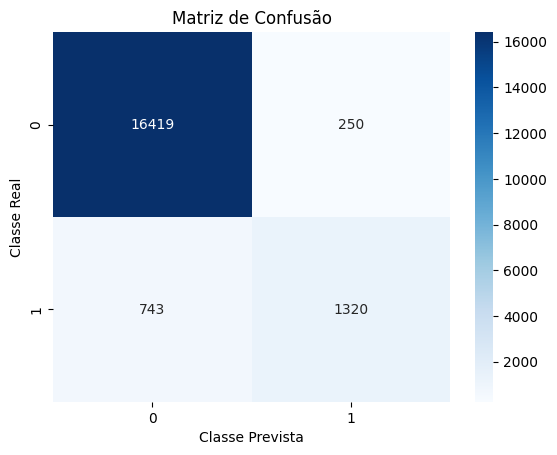

In [ ]:
#KNN

#Construção do modelo
knn = neighbors.KNeighborsClassifier(n_neighbors=3)  #número de vizinhos = 3

knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)

#Métricas para avaliar o modelo

# Calculando a acurácia e o F Score

print("Acurácia: %0.2f" % (accuracy_score(y_test, y_pred)*100) + "%")
print("F1 score: %0.2f" % (f1_score(y_test, y_pred, average='weighted')*100) + "%")

# Calcular a matriz de confusão
cm = confusion_matrix(y_test, y_pred)

# Visualizar a matriz de confusão usando um heatmap
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Configurações adicionais
plt.title("Matriz de Confusão")
plt.xlabel("Classe Prevista")
plt.ylabel("Classe Real")

# Mostrar o gráfico
plt.show()

# Balanceamento de Dados






In [ ]:
#Dados Balanceados - Oversample

# Criar um dataset desbalanceado
X, y = make_classification(n_samples=100000, n_features=8, n_informative=2, n_redundant=0, n_repeated=0, n_classes=2, n_clusters_per_class=1, weights=[0.995, 0.005], class_sep=0.5, random_state=0)
# Conversão para um dataframe
df = pd.DataFrame({'gender': X[:, 0], 'age': X[:, 1], 'hypertension': X[:,2], 'heart_disease':X[:,3], 'smoking_history':X[:,4], 'bmi':X[:,5],'HbA1c_level':X[:,6],'blood_glucose_level':X[:,7], 'diabetes': y})
df['diabetes'].value_counts(normalize = True)

# Amostra aleatoriamente a classe minoritária
ros = RandomOverSampler(random_state=0)
X_resampled, y_resampled = ros.fit_resample(X, y)

# Train test split
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=42)

In [ ]:
df

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,0.545784,1.278749,-0.155184,0.019487,0.825551,0.740762,0.843119,0.912915,0
1,-0.176306,1.154557,-1.713978,-0.150994,-0.351515,0.552063,-0.952220,0.187598,0
2,0.595468,0.492033,-1.481970,0.001405,-0.863935,-0.554108,1.556118,0.621889,0
3,0.805553,-1.088259,-0.014976,-1.803190,0.903531,-1.585248,-1.670407,0.086074,0
4,0.139492,0.992361,-1.429865,0.571474,-0.341032,-1.432580,0.237416,1.018167,0
...,...,...,...,...,...,...,...,...,...
99995,0.039223,-1.866194,0.673565,-2.193403,-0.377573,-0.348982,0.504150,-0.001269,0
99996,-0.854789,0.926992,-0.654520,-3.148627,-1.261635,0.925456,-1.917813,0.111620,0
99997,-1.007485,-0.503764,-0.206518,-0.027291,-0.921460,0.602062,-0.461356,0.680008,0
99998,3.498446,0.845801,-0.427747,-0.833903,-0.781159,1.886972,0.367657,0.538079,0


# Métodos Supervisionados

##### Usando Dados Balanceados

<li> Naive Bayes </li>
<li> Random Forest</li>
<li> Decision Tree Classifier</li>
<li> KNN Classifier</li>

Acurácia: 60.64%
F1 score: 60.41%


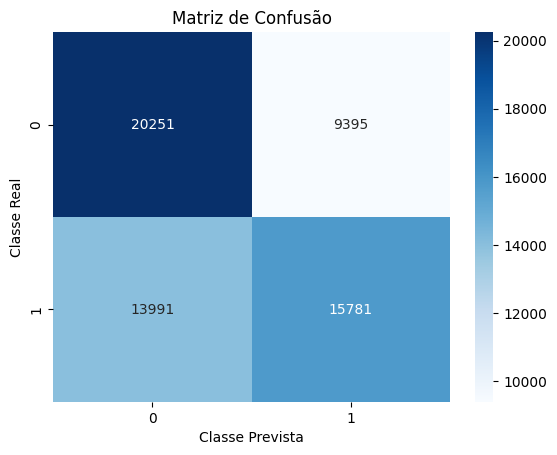

In [ ]:
#Naive Bayes
# Criar uma instância do classificador Naive Bayes
nb = GaussianNB()

# Treinar o modelo usando os dados de treinamento
nb.fit(X_train, y_train)

# Fazer previsões no conjunto de teste
y_pred = nb.predict(X_test)

from sklearn.metrics import accuracy_score, f1_score, confusion_matrix
import seaborn as sns

# Calculando a acurácia e o F Score

print("Acurácia: %0.2f" % (accuracy_score(y_test, y_pred)*100) + "%")
print("F1 score: %0.2f" % (f1_score(y_test, y_pred, average='weighted')*100) + "%")

# Calcular a matriz de confusão
cmNaive = confusion_matrix(y_test, y_pred)

# Visualizar a matriz de confusão usando um heatmap
sns.heatmap(cmNaive, annot=True, fmt="d", cmap="Blues")

# Configurações adicionais
plt.title("Matriz de Confusão")
plt.xlabel("Classe Prevista")
plt.ylabel("Classe Real")

# Mostrar o gráfico
plt.show()

Acurácia: 99.99%
F1 score: 99.99%


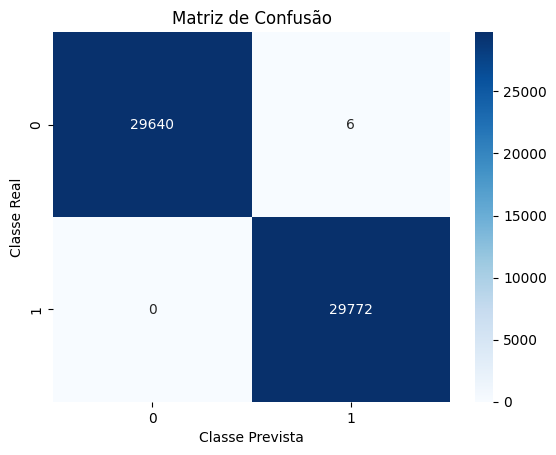

In [ ]:
#Random Forest

# Criação e treinamento do modelo Random Forest
model = RandomForestClassifier(n_estimators=50, random_state = 73)
model.fit(X_train, y_train)

# Fazendo previsões com o modelo
y_pred = model.predict(X_test)

# Calculando a acurácia e o F Score

print("Acurácia: %0.2f" % (accuracy_score(y_test, y_pred)*100) + "%")
print("F1 score: %0.2f" % (f1_score(y_test, y_pred, average='weighted')*100) + "%")

# Calcular a matriz de confusão
cm = confusion_matrix(y_test, y_pred)

# Visualizar a matriz de confusão usando um heatmap
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Configurações adicionais
plt.title("Matriz de Confusão")
plt.xlabel("Classe Prevista")
plt.ylabel("Classe Real")

# Mostrar o gráfico
plt.show()

Acurácia: 99.38%
F1 score: 99.38%


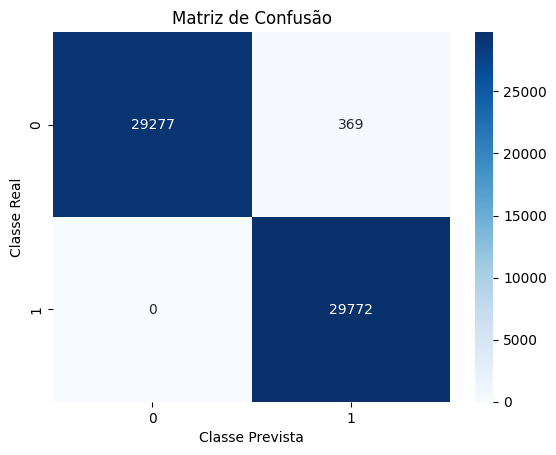

In [ ]:
#Árvore de decisão

features = df_normalizado_escala.drop(['diabetes'], axis=1) #características
features_names = list(features.columns)

#Sem profundidade definida
dt = DecisionTreeClassifier()

#Construção do modelo
model = dt.fit(X_train, y_train)

y_pred = model.predict(X_test)

# Calculando a acurácia e o F Score

print("Acurácia: %0.2f" % (accuracy_score(y_test, y_pred)*100) + "%")
print("F1 score: %0.2f" % (f1_score(y_test, y_pred, average='weighted')*100) + "%")

# Calcular a matriz de confusão
cm = confusion_matrix(y_test, y_pred)

# Visualizar a matriz de confusão usando um heatmap
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Configurações adicionais
plt.title("Matriz de Confusão")
plt.xlabel("Classe Prevista")
plt.ylabel("Classe Real")

# Mostrar o gráfico
plt.show()

#Plot da árvore de decisão

dot_data = tree.export_graphviz(
         dt,
         out_file=None,
         feature_names=features_names,
         filled=True, rounded=True,
         proportion=False,
         node_ids=True,
         rotate=False
        )
graph = graphviz.Source(dot_data)
graph

Acurácia: 99.39%
F1 score: 99.39%


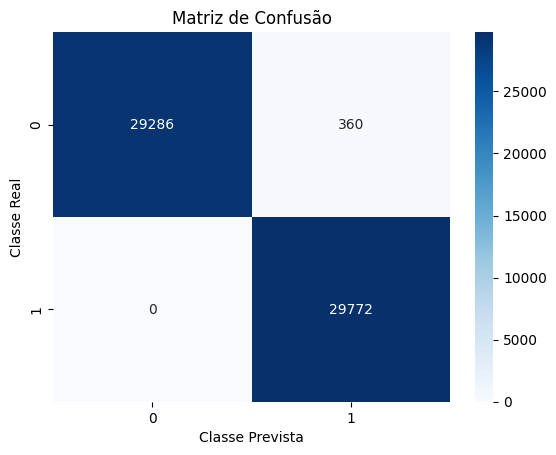

In [ ]:
#KNN

#Construção do modelo
knn = neighbors.KNeighborsClassifier(n_neighbors=1)  #número de vizinhos = 1

knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)

#Métricas para avaliar o modelo

# Calculando a acurácia e o F Score

print("Acurácia: %0.2f" % (accuracy_score(y_test, y_pred)*100) + "%")
print("F1 score: %0.2f" % (f1_score(y_test, y_pred, average='weighted')*100) + "%")

# Calcular a matriz de confusão
cm = confusion_matrix(y_test, y_pred)

# Visualizar a matriz de confusão usando um heatmap
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Configurações adicionais
plt.title("Matriz de Confusão")
plt.xlabel("Classe Prevista")
plt.ylabel("Classe Real")

# Mostrar o gráfico
plt.show()

Acurácia: 98.83%
F1 score: 98.83%


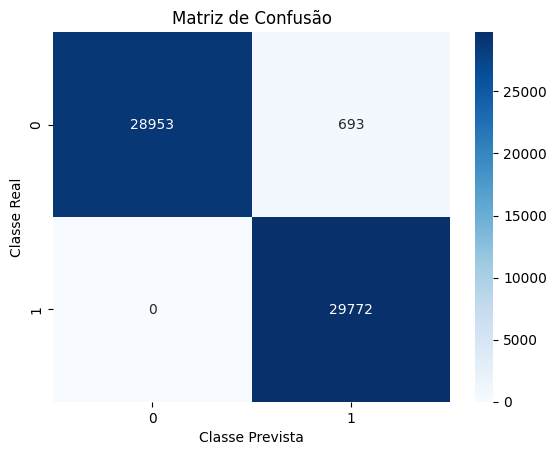

In [ ]:
#KNN

#Construção do modelo

knn = neighbors.KNeighborsClassifier(n_neighbors=3)  #número de vizinhos = 3

knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)

#Métricas para avaliar o modelo

# Calculando a acurácia e o F Score

print("Acurácia: %0.2f" % (accuracy_score(y_test, y_pred)*100) + "%")
print("F1 score: %0.2f" % (f1_score(y_test, y_pred, average='weighted')*100) + "%")

# Calcular a matriz de confusão
cm = confusion_matrix(y_test, y_pred)

# Visualizar a matriz de confusão usando um heatmap
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

# Configurações adicionais
plt.title("Matriz de Confusão")
plt.xlabel("Classe Prevista")
plt.ylabel("Classe Real")

# Mostrar o gráfico
plt.show()